<a href="https://colab.research.google.com/github/eco-abhi/Pytorch/blob/main/Pytorch_Linear_Classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

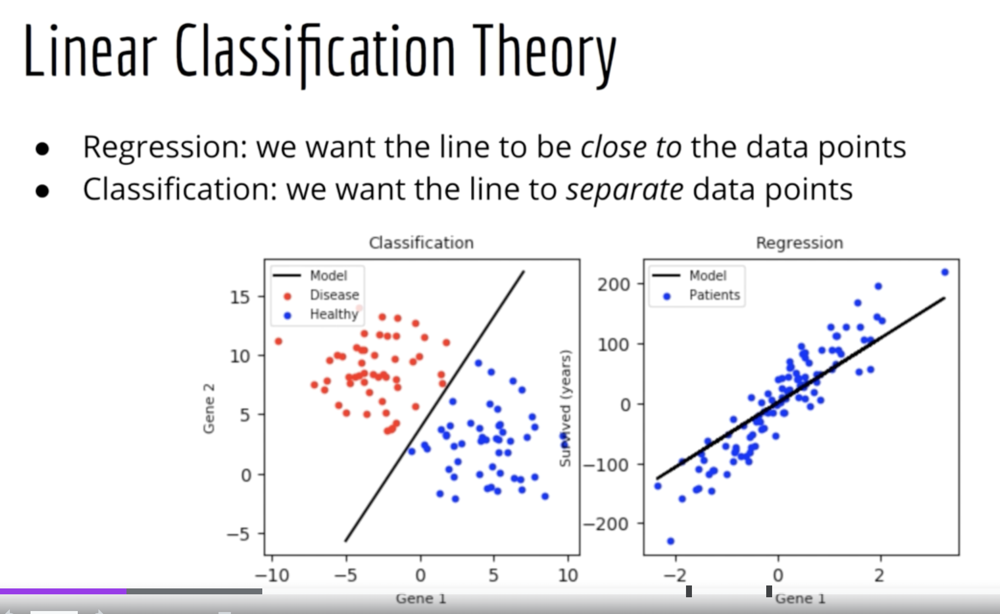# Linear C

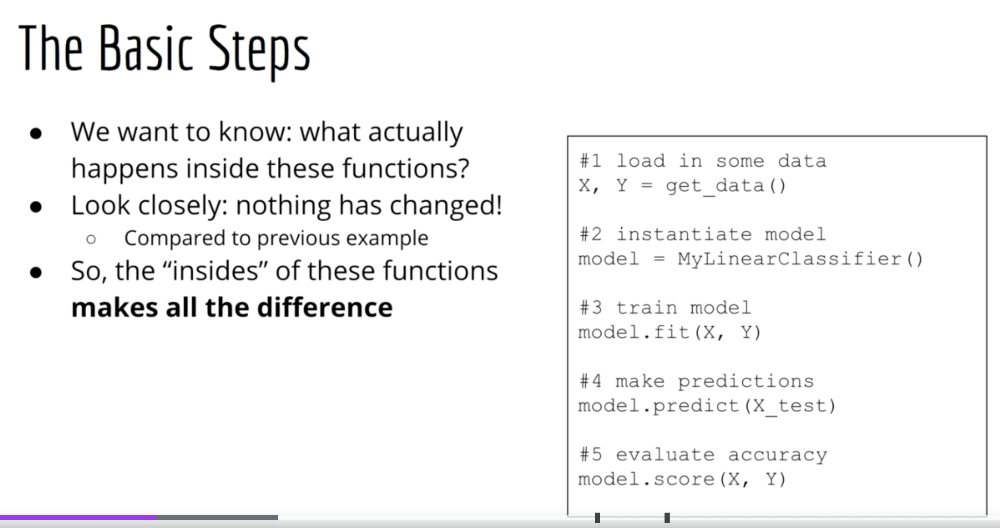

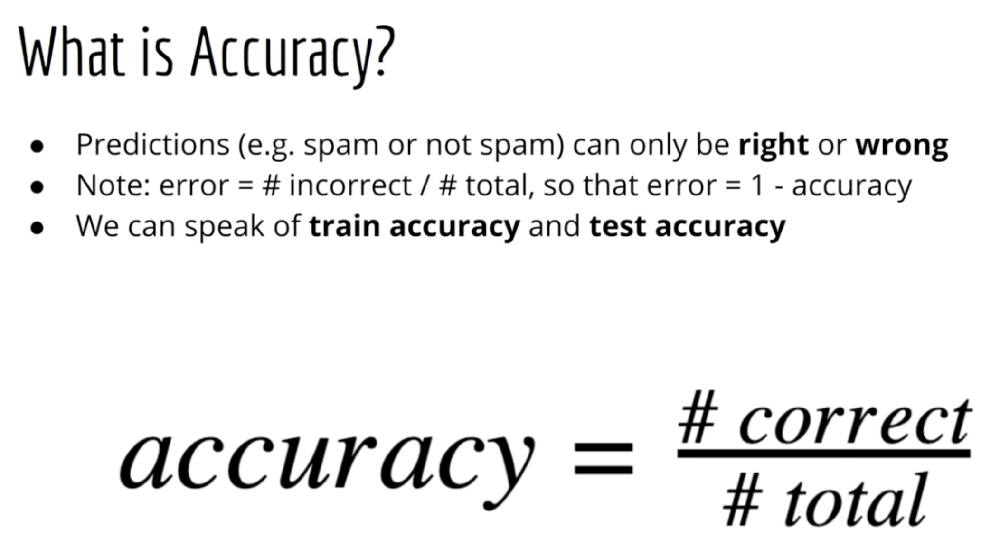

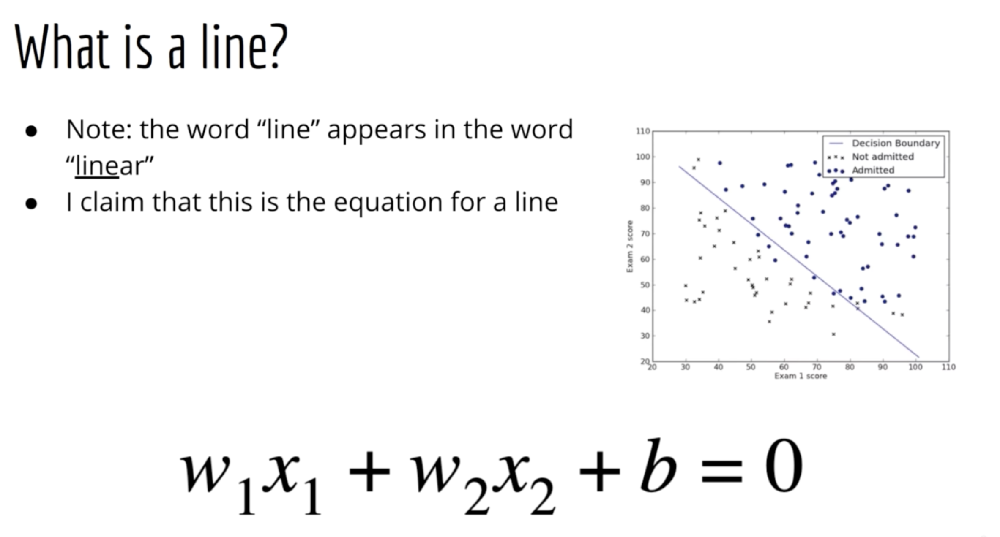

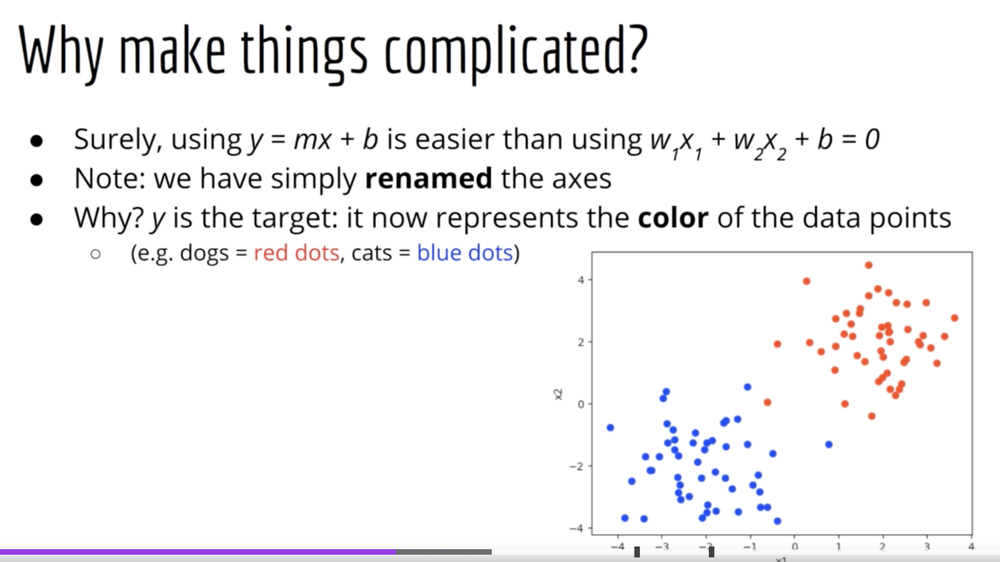

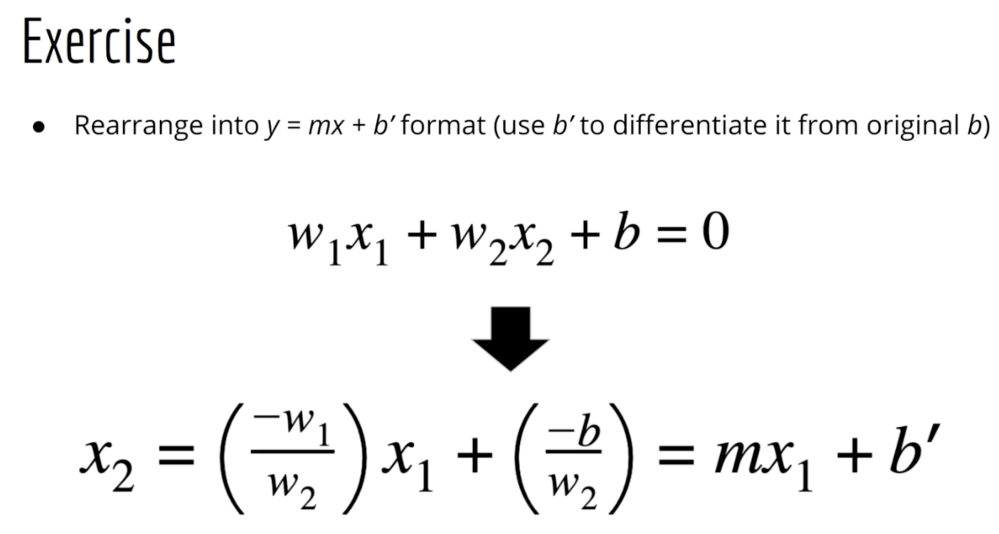

...

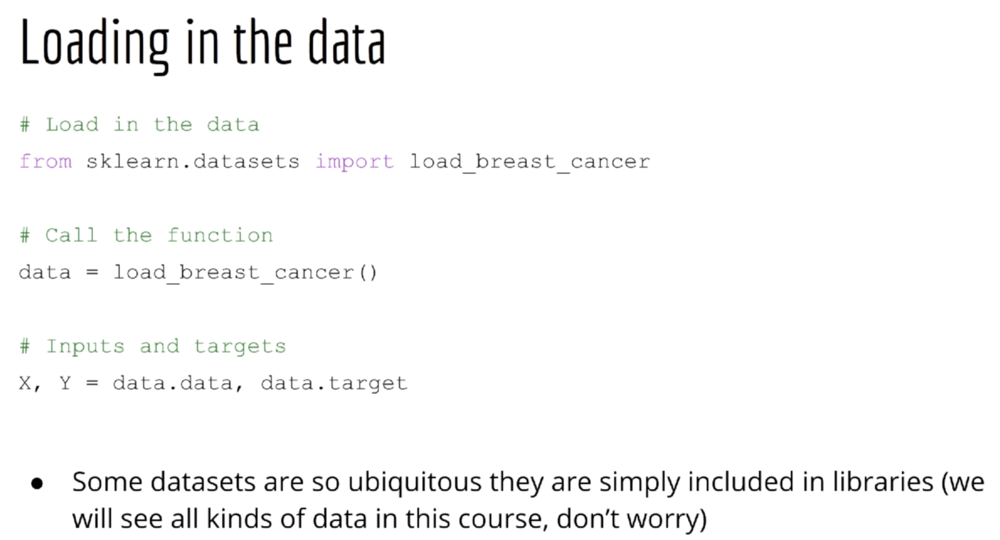

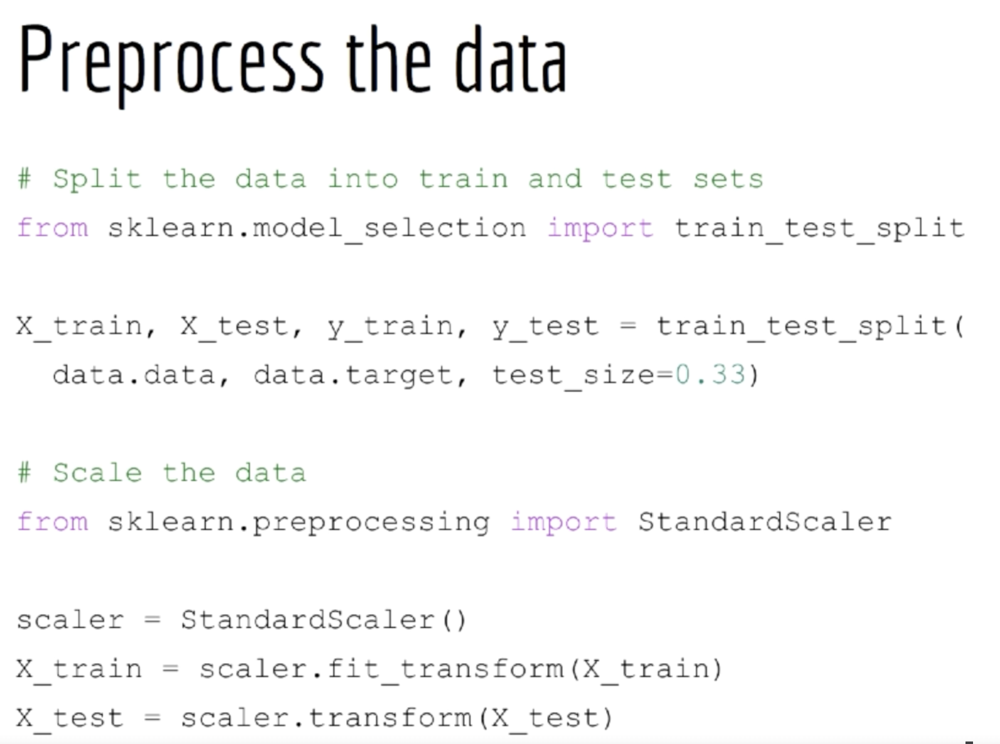

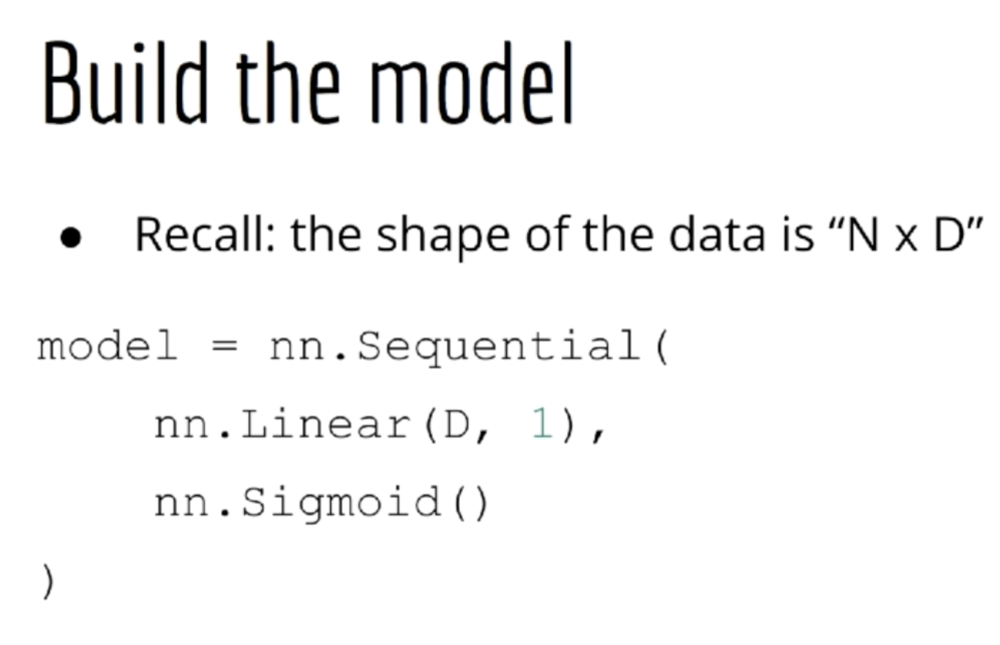

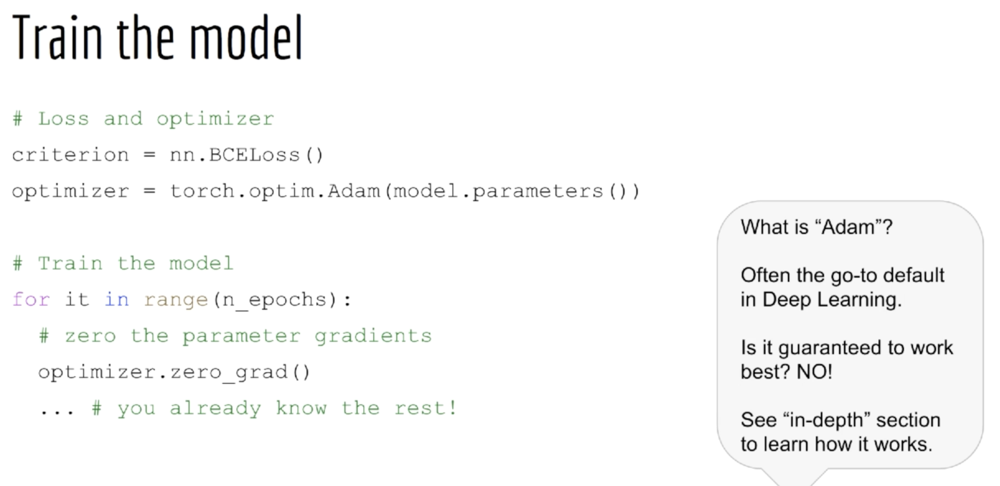

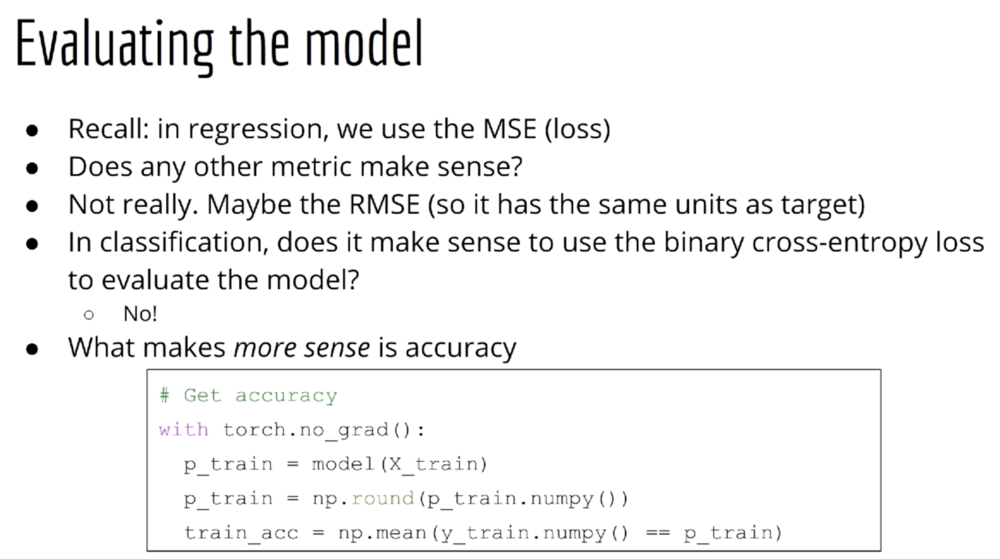

In [51]:
# Import libraries

import torch
import torch.nn as nn
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [52]:
# Load in the data
from sklearn.datasets import load_breast_cancer

In [53]:
# Load the data
data = load_breast_cancer()

In [54]:
# Check the type of the data
type(data)

sklearn.utils._bunch.Bunch

In [55]:
data.keys()

dict_keys(['data', 'target', 'frame', 'target_names', 'DESCR', 'feature_names', 'filename', 'data_module'])

In [56]:
data.data.shape

(569, 30)

In [57]:
data.target

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0,
       1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0,
       1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1,
       1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0,
       0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1,
       1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 0, 0,
       0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0,
       1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1,
       1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0,

In [58]:
data.target_names

array(['malignant', 'benign'], dtype='<U9')

In [59]:
data.target.shape

(569,)

In [60]:
data.feature_names

array(['mean radius', 'mean texture', 'mean perimeter', 'mean area',
       'mean smoothness', 'mean compactness', 'mean concavity',
       'mean concave points', 'mean symmetry', 'mean fractal dimension',
       'radius error', 'texture error', 'perimeter error', 'area error',
       'smoothness error', 'compactness error', 'concavity error',
       'concave points error', 'symmetry error',
       'fractal dimension error', 'worst radius', 'worst texture',
       'worst perimeter', 'worst area', 'worst smoothness',
       'worst compactness', 'worst concavity', 'worst concave points',
       'worst symmetry', 'worst fractal dimension'], dtype='<U23')

In [61]:
# Split the data into train and test
from sklearn.model_selection import train_test_split

In [62]:
X_train, X_test, y_train, y_test = train_test_split(data.data, data.target, test_size=0.33, random_state=42)
N, D = X_train.shape

In [63]:
# Scale the data
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [64]:
# Now all the fun Pytorch stuff
# Build the model
model = nn.Sequential(
    nn.Linear(D, 1),
    nn.Sigmoid())

In [65]:
# Loss and optimizer
criterion = nn.BCELoss()
optimizer = torch.optim.Adam(model.parameters())

In [66]:
# Convert data into torch tensors
X_train = torch.from_numpy(X_train.astype(np.float32))
y_train = torch.from_numpy(y_train.astype(np.float32).reshape(-1, 1))
X_test = torch.from_numpy(X_test.astype(np.float32))
y_test = torch.from_numpy(y_test.astype(np.float32).reshape(-1, 1))

In [67]:
# Train the model
n_epochs = 1000

# Store losses
train_losses = np.zeros(n_epochs)
test_losses = np.zeros(n_epochs)

for it in range(n_epochs):

    # Zero the parameter gradients
    optimizer.zero_grad()

    # Forward pass
    outputs = model(X_train)
    loss = criterion(outputs, y_train)

    # Backward and optimize
    loss.backward()
    optimizer.step()

    # Get test loss
    outputs_test = model(X_test)
    loss_test = criterion(outputs_test, y_test)

    # Store losses
    train_losses[it] = loss.item()
    test_losses[it] = loss_test.item()

    if (it + 1) % 50 == 0:
        print(f'Epoch {it+1}/{n_epochs}, Train Loss: {loss.item():.4f}, Test Loss: {loss_test.item():.4f}')


Epoch 50/1000, Train Loss: 0.4802, Test Loss: 0.4705
Epoch 100/1000, Train Loss: 0.3540, Test Loss: 0.3496
Epoch 150/1000, Train Loss: 0.2863, Test Loss: 0.2841
Epoch 200/1000, Train Loss: 0.2440, Test Loss: 0.2422
Epoch 250/1000, Train Loss: 0.2150, Test Loss: 0.2129
Epoch 300/1000, Train Loss: 0.1938, Test Loss: 0.1911
Epoch 350/1000, Train Loss: 0.1777, Test Loss: 0.1742
Epoch 400/1000, Train Loss: 0.1650, Test Loss: 0.1606
Epoch 450/1000, Train Loss: 0.1547, Test Loss: 0.1495
Epoch 500/1000, Train Loss: 0.1462, Test Loss: 0.1402
Epoch 550/1000, Train Loss: 0.1390, Test Loss: 0.1324
Epoch 600/1000, Train Loss: 0.1329, Test Loss: 0.1256
Epoch 650/1000, Train Loss: 0.1276, Test Loss: 0.1197
Epoch 700/1000, Train Loss: 0.1230, Test Loss: 0.1146
Epoch 750/1000, Train Loss: 0.1189, Test Loss: 0.1100
Epoch 800/1000, Train Loss: 0.1152, Test Loss: 0.1059
Epoch 850/1000, Train Loss: 0.1120, Test Loss: 0.1023
Epoch 900/1000, Train Loss: 0.1090, Test Loss: 0.0990
Epoch 950/1000, Train Loss: 0

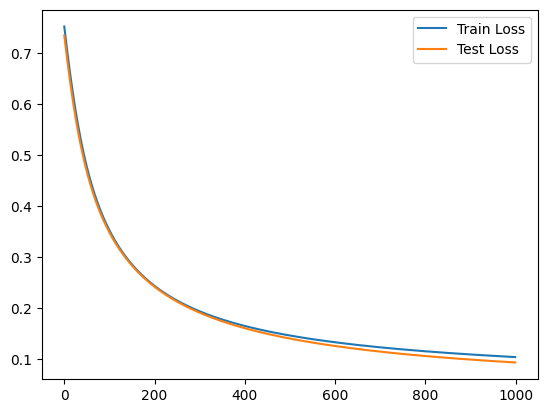

In [68]:
# Plot the train loss and test loss per iteration
plt.plot(train_losses, label='Train Loss')
plt.plot(test_losses, label='Test Loss')
plt.legend()
plt.show()

In [69]:
# Get accuracy
with torch.no_grad():
    p_train = model(X_train)
    p_train = np.round(p_train.numpy())
    train_acc = np.mean(p_train == y_train.numpy())

    p_test = model(X_test)
    p_test = np.round(p_test.numpy())
    test_acc = np.mean(p_test == y_test.numpy())

print(f'Train Accuracy: {train_acc:.4f}, Test Accuracy: {test_acc:.4f}')

Train Accuracy: 0.9764, Test Accuracy: 0.9894


## Saving and Loading a model

In [70]:
# Look at the state dict

model.state_dict()

OrderedDict([('0.weight',
              tensor([[-0.1727, -0.4439, -0.2778, -0.4201, -0.2391, -0.0949, -0.5025, -0.3390,
                       -0.2196,  0.6371, -0.2443,  0.0262, -0.2359, -0.3752,  0.0713,  0.0384,
                       -0.0264, -0.3428,  0.1213,  0.5266, -0.4373, -0.4451, -0.4876, -0.2794,
                       -0.4882, -0.2027, -0.1669, -0.3615, -0.2217, -0.3213]])),
             ('0.bias', tensor([0.4443]))])

In [71]:
# Save the model
torch.save(model.state_dict(), 'model.pt')

In [72]:
!ls

model.pt  sample_data


In [73]:
# Load the model

model2 = nn.Sequential(
    nn.Linear(D, 1),
    nn.Sigmoid())

model2.load_state_dict(torch.load('model.pt'))

<All keys matched successfully>

In [74]:
# Evaluate the new model
with torch.no_grad():
    p_train = model2(X_train)
    p_train = np.round(p_train.numpy())
    train_acc = np.mean(p_train == y_train.numpy())

    p_test = model2(X_test)
    p_test = np.round(p_test.numpy())
    test_acc = np.mean(p_test == y_test.numpy())

print(f'Train Accuracy: {train_acc:.4f}, Test Accuracy: {test_acc:.4f}')

Train Accuracy: 0.9764, Test Accuracy: 0.9894


In [75]:
# Download the model to local
from google.colab import files
files.download('model.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>